In this notebook, we will try the process of implementing CNN with Keras in order to classify images.

I.   **Firstly**, we'll import useful packages.

II.   **Then**, we'll load the data, before visualize and preprocess it.

III.  **We'll try a simple CNN model** and then we will evaluate its performances.

IV.   **Finally,** we'll use techniques such as data augmentation, learning rate decay and dropout to increase our test F1.

# I. Let import all useful packages.

In [100]:

from tensorflow.keras import Model
import tensorflow.keras.optimizers as Optimizer
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.models import load_model
from tensorflow.keras.callbacks import TensorBoard
import os
import numpy as np
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.image as mpimg
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dropout, Dense, BatchNormalization, GlobalAveragePooling2D
from tensorflow.keras import Sequential
import datetime

In [ ]:
pip install tensorflow_addons

     |████████████████████████████████| 1.1 MB 4.9 MB/s 


In [ ]:
import tensorflow_addons as tfa

**Task 1:** Setting Fre GPU in this Google Colab notebook.

[*Hint.*](https://medium.com/deep-learning-turkey/google-colab-free-gpu-tutorial-e113627b9f5d)

## Mounting Google Drive locally
**Task 2:** Mount the Google Driver into the Google Colab Driver.

[*Hint.*](https://colab.research.google.com/notebooks/io.ipynb#scrollTo=eikfzi8ZT_rW)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


**Task 3**: Copy the zip dataset from Google Drive into Colab, then unzip it and finally remove the zip file to free up space.

[*Hint.*](https://medium.com/datadriveninvestor/speed-up-your-image-training-on-google-colab-dc95ea1491cf)

In [ ]:
zip_path = '/content/drive/MyDrive/image-classification.zip'
!cp "{zip_path}" .
!unzip -q image-classification.zip
!rm image-classification.zip

# II. Load the data.

## About dataset.
This is image data of Natural Scenes around the world.
This Data contains around 25k images of size 150x150 distributed under 6 categories. {'buildings' -> 0, 'forest' -> 1, 'glacier' -> 2, 'mountain' -> 3, 'sea' -> 4, 'street' -> 5 }

The Train, Test and Prediction data is separated in each zip files. There are around 14k images in Train, 3k in Test.


Now, We need to prepare our data to feed into the model. There is a builtin method in Keras that can extract your images from folder.

Following is the gernalized functions used to extract data from the directory.

In [ ]:
# Here's our 6 categories that we have to classify.
class_names = ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']
class_names_label = {'buildings': 0,
                    'forest' : 1,
                    'glacier' : 2,
                    'mountain' : 3,
                    'sea' : 4,
                    'street' : 5}
nb_classes = 6

## Loading the Data

**Task 4:** We have to write a load_data function that load the training and test data ( which contain images and the labels) from the folder.

* **Load_data** function return **train_set** and **test_set**. Each set contains **images and labels**.
* Apply 2 augmentation transformations (**shear_range** = 0.2, **zoom_range** = 0.2), shuffle with seed = 8 and rescaling function( to [0, 1]) to **train_set.**
* Apply rescaling funtion to [0, 1]  to **test_set**, no shuffle.
* Batch size = 32.



[*Hint.*](https://keras.io/preprocessing/image/)


In [ ]:
def load_data(data_directories):
    """
        Load the data:
            - 14,034 images to train the network.
            - 3000 images to evaluate how accurately the network learned to classify images.
        Input:
            Data directory.
        Return: 
            training_set, testing_set.
    """
    ## TYPE YOUR CODE for task 4 here:
    train_generator = ImageDataGenerator(rescale = 1./255,
                                         shear_range = 0.2,
                                         zoom_range = 0.2)
    test_generator = ImageDataGenerator(rescale = 1./255)
    training_set = train_generator.flow_from_directory(data_directories[0],
                                                       target_size = (150, 150),
                                                       batch_size = 32,
                                                       shuffle = True,
                                                       seed = 8)
    testing_set = test_generator.flow_from_directory(data_directories[1],
                                                     target_size = (150, 150),
                                                     batch_size = 32,
                                                     shuffle = False)
    return training_set, testing_set


data_directories = ['seg_train/seg_train/', 'seg_test/seg_test/']
train_dataset, test_dataset = load_data(data_directories)

Found 14034 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.


In [ ]:
train_dataset.class_indices

{'buildings': 0,
 'forest': 1,
 'glacier': 2,
 'mountain': 3,
 'sea': 4,
 'street': 5}

## Let's explore the dataset.
We can, for example, ask ourselves:

* How many training and testing examples do we have ?
* What is the size of the images ?
* What is the proportion of each observed category ?

As you see, The Training data is in shape of (Number of Training Images, Width of image, Height of image, Channel of image). This shape is very important. If you didnot resize the images to same size. It should be (No. of images,) shape. So, using this shape you cant feed the images to the model.


**Task 5:** Print out:

*  Number of training examples.
*  Number of testing examples.
* Size of each image.



In [ ]:
## TYPE YOUR CODE for task 5 here:
print('Number of training examples:', train_dataset.samples)
print('Number of testing examples:', test_dataset.samples)
print('Each image is of size:', train_dataset.target_size)

Number of training examples: 14034
Number of testing examples: 3000
Each image is of size: (150, 150)


**Task 6:** Plot a pie chart of the proportion of each class.
You need to show the name and proportion of each class on the pie chart.

*Hint:* [plot.pie](https://matplotlib.org/3.1.1/gallery/pie_and_polar_charts/pie_features.html#sphx-glr-gallery-pie-and-polar-charts-pie-features-py)

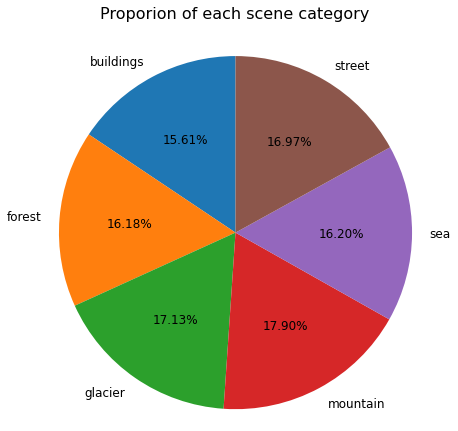

In [ ]:
def plot_pie(train_dataset, class_names):
    ## TYPE YOUR CODE for task 6 here:
    sizes = np.unique(train_dataset.labels, return_counts=True)[1]
    plt.figure(figsize = (7,7))
    plt.pie(sizes, labels=class_names, autopct='%1.2f%%', startangle=90, textprops={'fontsize': 12})
    plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
    plt.title('Proporion of each scene category', fontsize = 16, pad = 25)
    plt.show()

plot_pie(train_dataset, class_names)

**Task 7**: Display the 36 random images from the training set.

* Each class contain 6 random images.
* Bellow the image, show the class it belongs to.

*Hint*: [plot.imshow](https://matplotlib.org/3.1.0/gallery/images_contours_and_fields/image_demo.html)

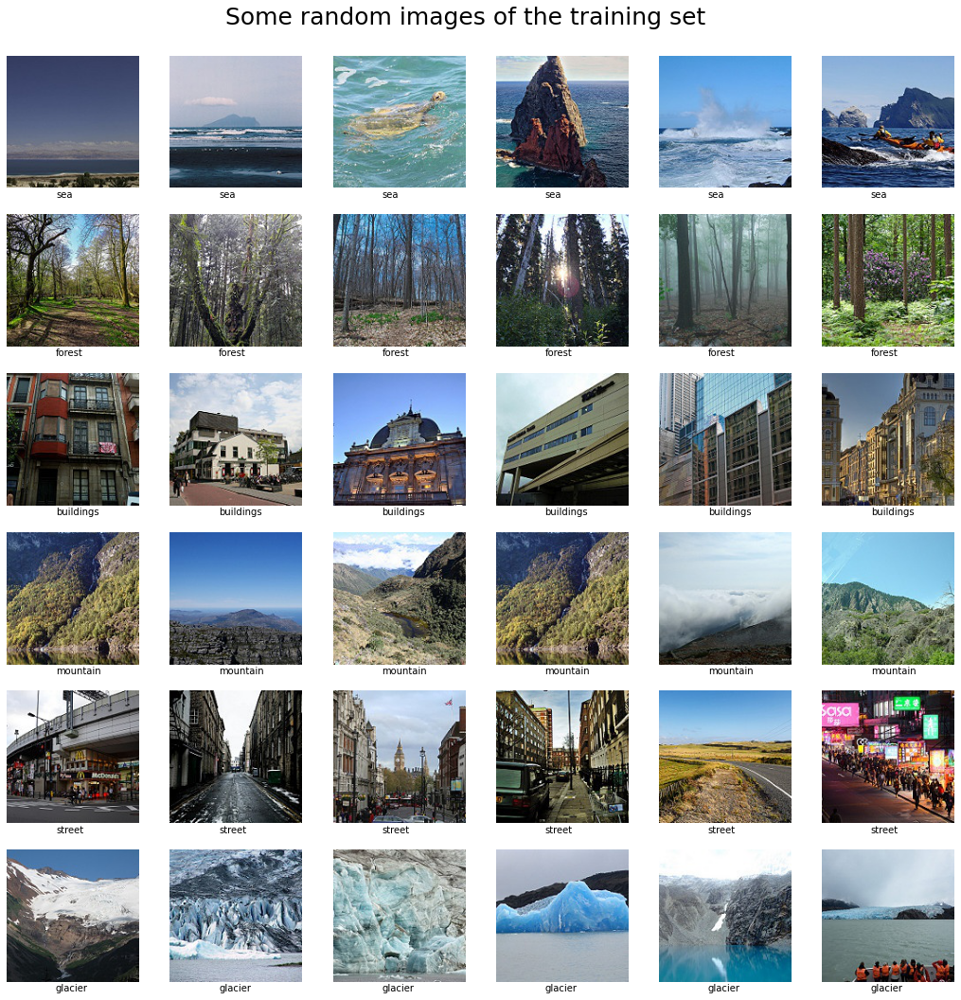

In [ ]:
def visualize_image(train_directory):
    ## TYPE YOUR CODE for task 7 here:
    fig, ax = plt.subplots(6,6, figsize = (18, 18))
    categories = []
    list_plot = []
    i = 0
    for category in os.listdir(train_directory):
      categories.append(category)
      path = os.path.join(train_directory, category)
      category_file = os.listdir(path) 
      to_plot = np.random.choice(category_file, 6)
      list_plot.append(to_plot)
    path = os.path.join(train_directory)
    for category, lst_plot in zip(categories, list_plot):
      for j, img_path in enumerate(lst_plot):
        ax[i][j].imshow(mpimg.imread(os.path.join(path, category, img_path)))
        ax[i][j].text(55, 160, category, fontsize = 10)
        ax[i][j].axis('off')  
      i += 1
    plt.suptitle('Some random images of the training set', fontsize = 25, y = 0.92)
    plt.show()

train_directory = 'seg_train/seg_train/'
visualize_image(train_directory)

# III. Modelling
## There are some steps we need to finish:
* Build the model.

* Compile the model.

* Train / fit the data to the model.

* Evaluate the model on the testing set.


## Build the model
We can build an easy model composed of different layers such as:

* [Conv2D](https://www.tensorflow.org/api_docs/python/tf/keras/layers/Conv2D).

* [MaxPooling2D:](https://www.tensorflow.org/api_docs/python/tf/keras/layers/MaxPool2D) The images get smaller sized.

* [Flatten:](https://www.tensorflow.org/api_docs/python/tf/keras/layers/Flatten) Transforms the format of the images from a 2d-array to a 1d-array of 150 150 3 pixel values.

* [Relu:](https://www.tensorflow.org/api_docs/python/tf/keras/layers/ReLU) given a value x, returns max(x, 0).

* [Softmax:](https://www.tensorflow.org/api_docs/python/tf/keras/layers/Softmax) 6 neurons, probability that the image belongs to one of the classes.

* [Dense.](https://www.tensorflow.org/api_docs/python/tf/keras/layers/Dense)

* [Dropout.](https://www.tensorflow.org/api_docs/python/tf/keras/layers/Dropout)

**Task 8**: Buil a model, which contain these layers:
- Layer 1: Conv2D, 8 filters, kernel_size = (3, 3), activation = 'relu', input_shape = image_shape, same padding.
- Layer 2: Conv2D, 16 filters, kernel_size = (3, 3), activation = 'relu', same padding.
- Layer 3: MaxPooling2D, pooling size = (2, 2).
- Layer 4: Conv2D, 32 filters, kernel_size = (3, 3), activation = 'relu', same padding.
- Layer 5: Conv2D, 64 filters, kernel_size = (3, 3), activation = 'relu', same padding.
- Layer 6: MaxPooling2D, pooling size = (3, 3).
- Layer 7: Conv2D, 128 filters, kernel_size = (3, 3), activation = 'relu', same padding.
- Layer 8: Conv2D, 256 filters, kernel_size = (3, 3), activation = 'relu', same padding.
- Layer 9: MaxPooling2D, pooling size = (5, 5).
- Layer 10: Flatten.
- Layer 11: Dense with number of unit = 100, activation = 'relu'.
- Layer 12: Dropout with probs = 0.5.
- Layer 13: Final dense with number of unit = number of class, activation = 'softmax'.



All the Conv2D and Dense layers are followed by a Batch Norm layer with customized configuration excepts from the last dense layer:

- momentum=0.95 
- epsilon=0.005
- beta_initializer = RandomNormal with mean = 0 and stddev = 0.05
- gammaa_initializer = Constant with value = 0.9


In [ ]:
def create_model():
    '''
    Return: 
        CNN model with 13 layers.
    ''' 
    model = Sequential([
            Conv2D(8, (3,3), activation = 'relu', input_shape = (150, 150, 3), padding = 'same'),
            BatchNormalization(momentum= 0.95, epsilon= 0.005, 
                               beta_initializer= tf.keras.initializers.RandomNormal(mean = 0, stddev = 0.05),
                               gamma_initializer= tf.keras.initializers.Constant(value = 0.9)),
            Conv2D(16, (3,3), activation= 'relu', padding  ='same'),
            BatchNormalization(momentum= 0.95, epsilon= 0.005, 
                               beta_initializer= tf.keras.initializers.RandomNormal(mean = 0, stddev = 0.05),
                               gamma_initializer= tf.keras.initializers.Constant(value = 0.9)),
            MaxPooling2D((2,2)),
            Conv2D(32, (3,3), activation= 'relu', padding  ='same'),
            BatchNormalization(momentum= 0.95, epsilon= 0.005, 
                               beta_initializer= tf.keras.initializers.RandomNormal(mean = 0, stddev = 0.05),
                               gamma_initializer= tf.keras.initializers.Constant(value = 0.9)),
            Conv2D(64, (3,3), activation= 'relu', padding  ='same'),
            BatchNormalization(momentum= 0.95, epsilon= 0.005, 
                               beta_initializer= tf.keras.initializers.RandomNormal(mean = 0, stddev = 0.05),
                               gamma_initializer= tf.keras.initializers.Constant(value = 0.9)),
            MaxPooling2D((3,3)),
            Conv2D(128, (3,3), activation= 'relu', padding  ='same'),
            BatchNormalization(momentum= 0.95, epsilon= 0.005, 
                               beta_initializer= tf.keras.initializers.RandomNormal(mean = 0, stddev = 0.05),
                               gamma_initializer= tf.keras.initializers.Constant(value = 0.9)),
            Conv2D(256, (3,3), activation= 'relu', padding  ='same'),
            BatchNormalization(momentum= 0.95, epsilon= 0.005, 
                               beta_initializer= tf.keras.initializers.RandomNormal(mean = 0, stddev = 0.05),
                               gamma_initializer= tf.keras.initializers.Constant(value = 0.9)),
            MaxPooling2D((5,5)),
            Flatten(),
            Dense(100, activation = 'relu'), 
            BatchNormalization(momentum= 0.95, epsilon= 0.005, 
                               beta_initializer= tf.keras.initializers.RandomNormal(mean = 0, stddev = 0.05),
                               gamma_initializer= tf.keras.initializers.Constant(value = 0.9)),
            Dropout(0.5),
            Dense(6, activation = 'softmax')
    ])
    ## TYPE YOUR CODE for task 8 here:

    return model
model = create_model()

**Task 9:** Compile the model. Then print out the model summary.
* [Compile](https://keras.io/models/model/#compile) the model with Adam Optimizaer, lr = 1e-4, categorical-crossentroy loss and "[F1 score](https://github.com/tensorflow/addons/issues/825)" as metric.
* Print out the model F1.

In [ ]:
def optimize(model):
    '''
    Input: 
        Model.
    Return: 
        Complied model.
    '''
    ## TYPE YOUR CODE for task 9 here:
    model.compile(optimizer = Optimizer.Adam(learning_rate = 1e-4),
                  loss='categorical_crossentropy',
                  metrics=[tfa.metrics.F1Score(num_classes=6, average = 'weighted')])
    
    return model

model = optimize(model)
print(model.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 150, 150, 8)       224       
                                                                 
 batch_normalization (BatchN  (None, 150, 150, 8)      32        
 ormalization)                                                   
                                                                 
 conv2d_1 (Conv2D)           (None, 150, 150, 16)      1168      
                                                                 
 batch_normalization_1 (Batc  (None, 150, 150, 16)     64        
 hNormalization)                                                 
                                                                 
 max_pooling2d (MaxPooling2D  (None, 75, 75, 16)       0         
 )                                                               
                                                        

**Task 10**: Setup callback.
* Create the [tensorboard callback](https://www.tensorflow.org/tensorboard/tensorboard_in_notebooks) to save the logs.
* Create the [checkpoint callback](https://machinelearningmastery.com/check-point-deep-learning-models-keras/) to save the checkpoint with the best F1 after each epoch. 
* Create the [ReduceLROnPlateau callback](https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/ReduceLROnPlateau) to reduce learning rate when the validation F1 score has stopped improving with the factor of 0.1 and patience = 2.

In [ ]:
def callback_model(checkpoint_name, logs_name):
    '''
    Input: 
        Best checkpoint name, logs name.
    Return: 
        Callback list, which contains tensorboard callback and checkpoint callback.
    '''
    ## TYPE YOUR CODE for task 10 here:
    #logdir = os.path.join(logs_name, datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
    #tensorboard_callback = TensorBoard(logs_dir = logs_name, histogram_freq=1)
    log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
    tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)
    reduce_lr_plateu_callback = tf.keras.callbacks.ReduceLROnPlateau(factor = 0.1, patience = 2, monitor = 'val_f1_score', mode = 'max')
    checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(checkpoint_name, save_best_only = True, verbose = 1, monitor= 'val_f1_score', mode = 'max')
    callbacks_list = [tensorboard_callback, reduce_lr_plateu_callback, checkpoint_callback]
    return callbacks_list

checkpoint_name = 'weights.best.hdf5'
logs_name = 'training_logs'
callbacks_list = callback_model(checkpoint_name, logs_name)

In [ ]:
callbacks_list

**Task 11:** Train the model.

**Requirement:** 
* Train the model with 10 epochs, generator = train_dataset, validataion_data = test_dataset.
* Return the model with best-checkpoint weights.

*Hint:*
[Fit](https://keras.io/models/sequential/#fit_generator) the model first, then reload the model ([load_model function](https://keras.io/getting-started/faq/)) with best-checkpoint weights.

In [ ]:
def train_model(model, callbacks_list):
    '''
    Input: 
        Model and callback list,
    Return: 
        Model with best-checkpoint weights.
    '''
    ## TYPE YOUR CODE for task 11 here:
    model.fit(train_dataset, epochs =10, validation_data = test_dataset, callbacks= callbacks_list)
    del model
    model = load_model('weights.best.hdf5')
    return model
model = train_model(model, callbacks_list)

Epoch 1/10
439/439 [==============================] - ETA: 0s - loss: 1.0709 - f1_score: 0.6096
Epoch 00001: val_f1_score improved from -inf to 0.75599, saving model to weights.best.hdf5
439/439 [==============================] - 120s 244ms/step - loss: 1.0709 - f1_score: 0.6096 - val_loss: 0.6787 - val_f1_score: 0.7560 - lr: 1.0000e-04
Epoch 2/10
439/439 [==============================] - ETA: 0s - loss: 0.7459 - f1_score: 0.7337
Epoch 00002: val_f1_score improved from 0.75599 to 0.79464, saving model to weights.best.hdf5
439/439 [==============================] - 107s 243ms/step - loss: 0.7459 - f1_score: 0.7337 - val_loss: 0.5785 - val_f1_score: 0.7946 - lr: 1.0000e-04
Epoch 3/10
439/439 [==============================] - ETA: 0s - loss: 0.6510 - f1_score: 0.7701
Epoch 00003: val_f1_score improved from 0.79464 to 0.79787, saving model to weights.best.hdf5
439/439 [==============================] - 105s 238ms/step - loss: 0.6510 - f1_score: 0.7701 - val_loss: 0.5664 - val_f1_score: 0

**Task 12**: [Show the tensorboard](https://www.tensorflow.org/tensorboard/tensorboard_in_notebooks) in the notebook.

In [1]:

%load_ext tensorboard

In [2]:
## TYPE YOUR CODE for task 12 here:

%tensorboard --logdir 'logs'

Reusing TensorBoard on port 6006 (pid 6428), started 0:03:27 ago. (Use '!kill 6428' to kill it.)

**Task 13:** Prediction on test set.
* Complete the get_prediction_classes function.
* Print out the test F1. 

In [ ]:
def get_prediction_classes(model, prediction_dataset):
    ## TYPE YOUR CODE for task 13 here:
    '''
    Input: 
        Model and prediction dataset.
    Return: 
        Prediction list and groundtrurth list with predicted classes.
    '''
    prediction = model.predict(prediction_dataset, verbose = 0)
    prediction_list = np.argmax(prediction, axis = -1)
    groundtruth = prediction_dataset.labels
    print('Test F1:', model.evaluate(prediction_dataset, verbose = 0)[1])
    return prediction_list, groundtruth
test_predictions, groundtruth_list = get_prediction_classes(model, test_dataset)

Test F1: 0.8450455069541931


In [ ]:
test_predictions

array([0, 0, 0, ..., 4, 3, 5])

In [ ]:
groundtruth_list

array([0, 0, 0, ..., 5, 5, 5], dtype=int32)

**Task 14:** Perform the predicted result on test set using confusion matrix.
Remember to show the class name in the confusion matrix. 

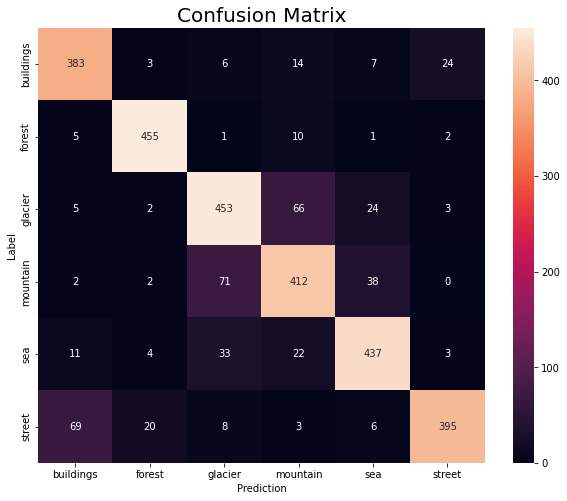

In [ ]:
def plot_confusion_matrix(predictions, groundtruth, class_names):
    ## TYPE YOUR CODE for task 14 here:
    confusion_maxtrix = tf.math.confusion_matrix(groundtruth, predictions, num_classes= 6)
    plt.figure(figsize=(10, 8))
    sns.heatmap(confusion_maxtrix, xticklabels=class_names, yticklabels=class_names, 
                annot=True, fmt = 'g')
    plt.xlabel('Prediction')
    plt.ylabel('Label')
    plt.title('Confusion Matrix', fontsize = 20)
    plt.show()
plot_confusion_matrix(test_predictions, groundtruth_list, class_names)

**Task 15**: Model finetuning - fine tune the model using some of these approachs:
* Increase max epochs, change batch size.
* Play around with CNN, Dense and Dropoutlayers (add/# units/etc).
* Increase data augmentation transformations.
* Try to use a [pretrained model](https://www.tensorflow.org/api_docs/python/tf/keras/applications) on Keras.

Requirement: The val_best_F1 should be higher than 87%.

### First, I will try training for 10 epochs:

In [ ]:
#train for 10 more epochs:
model = train_model(model, callbacks_list)

Epoch 1/10
439/439 [==============================] - ETA: 0s - loss: 0.3967 - f1_score: 0.8635
Epoch 00001: val_f1_score did not improve from 0.84505
439/439 [==============================] - 125s 284ms/step - loss: 0.3967 - f1_score: 0.8635 - val_loss: 0.5522 - val_f1_score: 0.8099 - lr: 1.0000e-04
Epoch 2/10
439/439 [==============================] - ETA: 0s - loss: 0.3712 - f1_score: 0.8694
Epoch 00002: val_f1_score did not improve from 0.84505
439/439 [==============================] - 104s 236ms/step - loss: 0.3712 - f1_score: 0.8694 - val_loss: 0.4821 - val_f1_score: 0.8414 - lr: 1.0000e-04
Epoch 3/10
439/439 [==============================] - ETA: 0s - loss: 0.3733 - f1_score: 0.8699
Epoch 00003: val_f1_score improved from 0.84505 to 0.86551, saving model to weights.best.hdf5
439/439 [==============================] - 102s 233ms/step - loss: 0.3733 - f1_score: 0.8699 - val_loss: 0.4073 - val_f1_score: 0.8655 - lr: 1.0000e-04
Epoch 4/10
439/439 [==============================] 

In [ ]:
test_predictions, groundtruth_list = get_prediction_classes(model, test_dataset)

Test F1: 0.8719707727432251


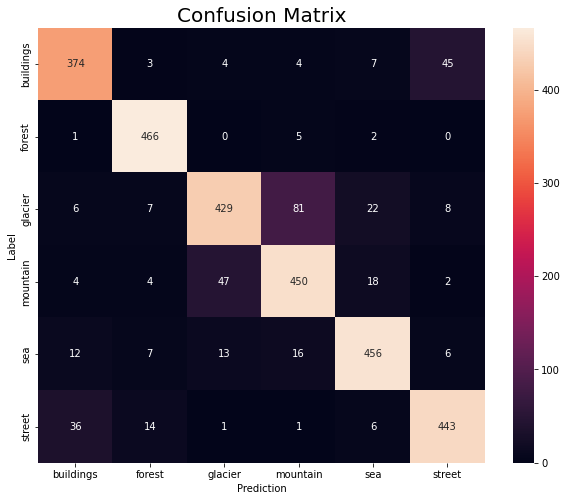

In [ ]:
plot_confusion_matrix(test_predictions, groundtruth_list, class_names)

It seems that training more epochs for this achitechture does help, but just a little bit.

### Next, I will try to build another architecture

In [ ]:
model = Sequential([
            Conv2D(32, (3,3), activation = 'relu', input_shape = (150, 150, 3)),
            Conv2D(32, (3,3), activation= 'relu'),
            BatchNormalization(),
            MaxPooling2D((2,2)),
            Conv2D(64, (3,3), activation= 'relu'),
            Conv2D(64, (3,3), activation= 'relu'),
            BatchNormalization(),
            MaxPooling2D((2,2)),
            Conv2D(128, (3,3), activation= 'relu'),
            BatchNormalization(),
            MaxPooling2D((2,2)),   
            Conv2D(128, (3,3), activation= 'relu'),
            BatchNormalization(),
            MaxPooling2D((2,2)), 
            Flatten(),
            Dense(128, activation = 'relu'), 
            BatchNormalization(),
            Dropout(0.25),
            Dense(6, activation = 'softmax')])
model.summary()

Model: "sequential_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_84 (Conv2D)          (None, 148, 148, 32)      896       
                                                                 
 conv2d_85 (Conv2D)          (None, 146, 146, 32)      9248      
                                                                 
 batch_normalization_75 (Bat  (None, 146, 146, 32)     128       
 chNormalization)                                                
                                                                 
 max_pooling2d_55 (MaxPoolin  (None, 73, 73, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_86 (Conv2D)          (None, 71, 71, 64)        18496     
                                                                 
 conv2d_87 (Conv2D)          (None, 69, 69, 64)      

In [ ]:
model.compile(optimizer=Optimizer.Adam(learning_rate = 1e-3),
                  loss='categorical_crossentropy',
                  metrics=[tfa.metrics.F1Score(num_classes=6, average = 'weighted')])
reduce_lr_plateu_callback = tf.keras.callbacks.ReduceLROnPlateau(factor = 0.1, patience = 2, monitor = 'val_f1_score', mode = 'max')
early_stopping_callback = tf.keras.callbacks.EarlyStopping(patience = 5, verbose = 1, monitor= 'val_f1_score', mode = 'max')
callbacks_list = [reduce_lr_plateu_callback, early_stopping_callback]
history = model.fit(train_dataset, epochs = 20, validation_data = test_dataset, callbacks= callbacks_list)

Epoch 1/20
439/439 [==============================] - 105s 235ms/step - loss: 0.9026 - f1_score: 0.6692 - val_loss: 1.6672 - val_f1_score: 0.4297 - lr: 0.0010
Epoch 2/20
439/439 [==============================] - 103s 234ms/step - loss: 0.6036 - f1_score: 0.7813 - val_loss: 1.3972 - val_f1_score: 0.5923 - lr: 0.0010
Epoch 3/20
439/439 [==============================] - 101s 230ms/step - loss: 0.4987 - f1_score: 0.8192 - val_loss: 0.7802 - val_f1_score: 0.7371 - lr: 0.0010
Epoch 4/20
439/439 [==============================] - 101s 229ms/step - loss: 0.4508 - f1_score: 0.8391 - val_loss: 1.2463 - val_f1_score: 0.5466 - lr: 0.0010
Epoch 5/20
439/439 [==============================] - 101s 229ms/step - loss: 0.4037 - f1_score: 0.8558 - val_loss: 0.8025 - val_f1_score: 0.6931 - lr: 0.0010
Epoch 6/20
439/439 [==============================] - 100s 228ms/step - loss: 0.3053 - f1_score: 0.8935 - val_loss: 0.3315 - val_f1_score: 0.8813 - lr: 1.0000e-04
Epoch 7/20
439/439 [======================

In [ ]:
test_predictions, groundtruth_list = get_prediction_classes(model, test_dataset)

Test F1: 0.8969417810440063


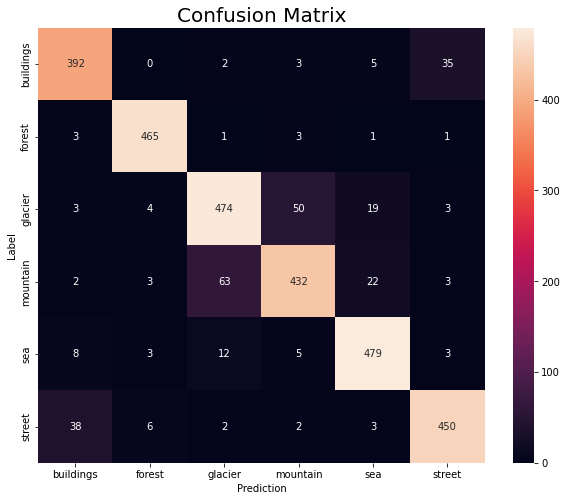

In [ ]:
plot_confusion_matrix(test_predictions, groundtruth_list, class_names)

The result is much better.

### Next, I will try to use the original architecture, but with different image augmentation

In [80]:
train_generator = ImageDataGenerator(rescale = 1./255.,
                                   rotation_range = 40,
                                   width_shift_range = 0.2,
                                   height_shift_range = 0.2,
                                   shear_range = 0.2,
                                   zoom_range = 0.2,
                                   horizontal_flip = True)
test_generator = ImageDataGenerator(rescale = 1./255)
training_set = train_generator.flow_from_directory(data_directories[0],
                                                    target_size = (150, 150),
                                                    batch_size = 32,
                                                    shuffle = True,
                                                    seed = 8)
testing_set = test_generator.flow_from_directory(data_directories[1],
                                                  target_size = (150, 150),
                                                  batch_size = 32,
                                                  shuffle = False)

Found 14034 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.


In [81]:
model = create_model()
model = optimize(model)
model = train_model(model, callbacks_list)

Epoch 1/10
439/439 [==============================] - 121s 268ms/step - loss: 1.0789 - f1_score: 0.6136 - val_loss: 0.7094 - val_f1_score: 0.7554 - lr: 1.0000e-04
Epoch 2/10
439/439 [==============================] - 106s 241ms/step - loss: 0.7445 - f1_score: 0.7355 - val_loss: 0.7494 - val_f1_score: 0.7518 - lr: 1.0000e-04
Epoch 3/10
439/439 [==============================] - 105s 238ms/step - loss: 0.6503 - f1_score: 0.7744 - val_loss: 0.5923 - val_f1_score: 0.7967 - lr: 1.0000e-04
Epoch 4/10
439/439 [==============================] - 104s 237ms/step - loss: 0.5909 - f1_score: 0.7941 - val_loss: 0.5636 - val_f1_score: 0.8024 - lr: 1.0000e-04
Epoch 5/10
439/439 [==============================] - 104s 237ms/step - loss: 0.5412 - f1_score: 0.8128 - val_loss: 0.5105 - val_f1_score: 0.8192 - lr: 1.0000e-04
Epoch 6/10
439/439 [==============================] - 105s 238ms/step - loss: 0.5116 - f1_score: 0.8231 - val_loss: 0.5427 - val_f1_score: 0.8101 - lr: 1.0000e-04
Epoch 7/10
439/439 [==

In [82]:
test_predictions, groundtruth_list = get_prediction_classes(model, test_dataset)

Test F1: 0.8719707727432251


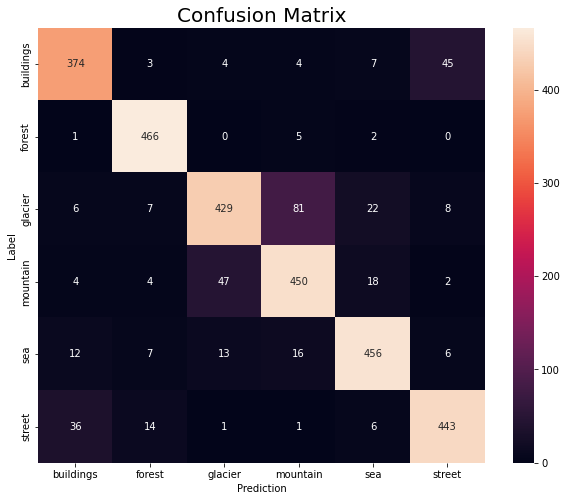

In [83]:
plot_confusion_matrix(test_predictions, groundtruth_list, class_names)

Again, it works. It seem that within 10 epochs, the original model with stronger image augmentation works better.

### Next, I will try to use transfer learning with InceptionV3 model.

In [84]:
from tensorflow.keras.applications.inception_v3 import InceptionV3

In [85]:
base_model = InceptionV3(input_shape = (150, 150, 3), 
                                include_top = False)
base_model.trainable = False

87924736/87910968 [==============================] - 3s 0us/step


In [89]:
x = Flatten()(base_model.output)
x = Dense(512, activation="relu")(x)
x = Dropout(0.2)(x)
x = Dense(6, activation="softmax")(x)
model = Model(base_model.input, x)

In [90]:
model.compile(optimizer=Optimizer.Adam(learning_rate = 1e-3),
                  loss='categorical_crossentropy',
                  metrics=[tfa.metrics.F1Score(num_classes=6, average = 'weighted')])
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 150, 150, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_96 (Conv2D)             (None, 74, 74, 32)   864         ['input_1[0][0]']                
                                                                                                  
 batch_normalization_87 (BatchN  (None, 74, 74, 32)  96          ['conv2d_96[0][0]']              
 ormalization)                                                                                    
                                                                                            

In [91]:
reduce_lr_plateu_callback = tf.keras.callbacks.ReduceLROnPlateau(factor = 0.1, patience = 2, monitor = 'val_f1_score', mode = 'max')
early_stopping_callback = tf.keras.callbacks.EarlyStopping(patience = 5, verbose = 1, monitor= 'val_f1_score', mode = 'max')
callbacks_list = [reduce_lr_plateu_callback, early_stopping_callback]
history = model.fit(train_dataset, epochs = 20, validation_data = test_dataset, callbacks= callbacks_list)

Epoch 1/20
439/439 [==============================] - 128s 263ms/step - loss: 0.8845 - f1_score: 0.8344 - val_loss: 0.3263 - val_f1_score: 0.8780 - lr: 0.0010
Epoch 2/20
439/439 [==============================] - 110s 251ms/step - loss: 0.3641 - f1_score: 0.8731 - val_loss: 0.3086 - val_f1_score: 0.8835 - lr: 0.0010
Epoch 3/20
439/439 [==============================] - 106s 241ms/step - loss: 0.3385 - f1_score: 0.8801 - val_loss: 0.2888 - val_f1_score: 0.8883 - lr: 0.0010
Epoch 4/20
439/439 [==============================] - 106s 241ms/step - loss: 0.2910 - f1_score: 0.8936 - val_loss: 0.3178 - val_f1_score: 0.8740 - lr: 0.0010
Epoch 5/20
439/439 [==============================] - 106s 241ms/step - loss: 0.2892 - f1_score: 0.8939 - val_loss: 0.3069 - val_f1_score: 0.8934 - lr: 0.0010
Epoch 6/20
439/439 [==============================] - 105s 239ms/step - loss: 0.2729 - f1_score: 0.9004 - val_loss: 0.3004 - val_f1_score: 0.8928 - lr: 0.0010
Epoch 7/20
439/439 [==========================

In [92]:
test_predictions, groundtruth_list = get_prediction_classes(model, test_dataset)

Test F1: 0.903928816318512


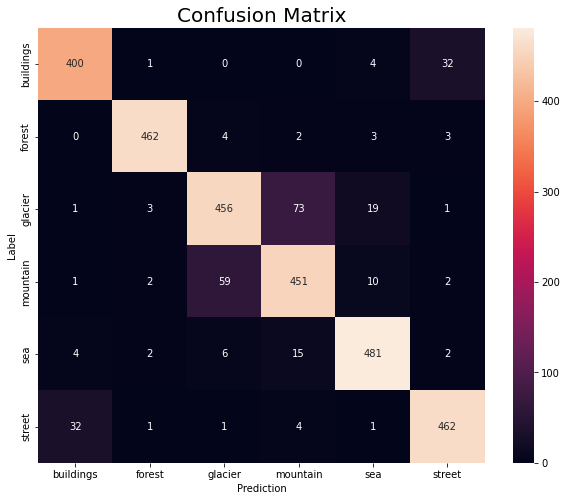

In [93]:
plot_confusion_matrix(test_predictions, groundtruth_list, class_names)

The result is great, even on the first epoch!

### Finaly, I will use transfer learing with Xception model.

In [98]:
from tensorflow.keras.applications.xception import Xception
from keras.applications.xception import preprocess_input

In [95]:
train_generator = ImageDataGenerator(preprocessing_function=preprocess_input,
                                   rotation_range = 40,
                                   width_shift_range = 0.2,
                                   height_shift_range = 0.2,
                                   shear_range = 0.2,
                                   zoom_range = 0.2,
                                   horizontal_flip = True)
test_generator = ImageDataGenerator(preprocessing_function=preprocess_input)
training_set = train_generator.flow_from_directory(data_directories[0],
                                                    target_size = (150, 150),
                                                    batch_size = 32,
                                                    shuffle = True,
                                                    seed = 8)
testing_set = test_generator.flow_from_directory(data_directories[1],
                                                  target_size = (150, 150),
                                                  batch_size = 32,
                                                  shuffle = False)

Found 14034 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.


In [104]:

base_model = Xception(weights='imagenet',
                      input_shape=(150, 150, 3),
                      include_top=False)
base_model.trainable = False

x = GlobalAveragePooling2D()(base_model.output)
x = Dropout(0.2)(x)
x = Dense(6, activation="softmax")(x)
model = Model(base_model.input, x)

model.compile(optimizer=Optimizer.Adam(learning_rate = 1e-3),
                  loss='categorical_crossentropy',
                  metrics=[tfa.metrics.F1Score(num_classes=6, average = 'weighted')])
model.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 150, 150, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 74, 74, 32)   864         ['input_5[0][0]']                
                                                                                                  
 block1_conv1_bn (BatchNormaliz  (None, 74, 74, 32)  128         ['block1_conv1[0][0]']           
 ation)                                                                                           
                                                                                            

In [105]:
history = model.fit(train_dataset, epochs = 10, validation_data = test_dataset, callbacks= callbacks_list)

Epoch 1/10
439/439 [==============================] - 123s 273ms/step - loss: 0.4160 - f1_score: 0.8526 - val_loss: 0.3006 - val_f1_score: 0.8917 - lr: 0.0010
Epoch 2/10
439/439 [==============================] - 125s 285ms/step - loss: 0.3066 - f1_score: 0.8885 - val_loss: 0.2809 - val_f1_score: 0.8925 - lr: 0.0010
Epoch 3/10
439/439 [==============================] - 122s 277ms/step - loss: 0.2891 - f1_score: 0.8959 - val_loss: 0.2767 - val_f1_score: 0.8921 - lr: 0.0010
Epoch 4/10
439/439 [==============================] - 111s 252ms/step - loss: 0.2769 - f1_score: 0.8974 - val_loss: 0.2601 - val_f1_score: 0.9009 - lr: 0.0010
Epoch 5/10
439/439 [==============================] - 129s 295ms/step - loss: 0.2706 - f1_score: 0.8986 - val_loss: 0.2784 - val_f1_score: 0.8949 - lr: 0.0010
Epoch 6/10
439/439 [==============================] - 115s 261ms/step - loss: 0.2659 - f1_score: 0.9027 - val_loss: 0.2578 - val_f1_score: 0.9092 - lr: 0.0010
Epoch 7/10
439/439 [==========================

In [106]:
test_predictions, groundtruth_list = get_prediction_classes(model, test_dataset)

Test F1: 0.9059666395187378


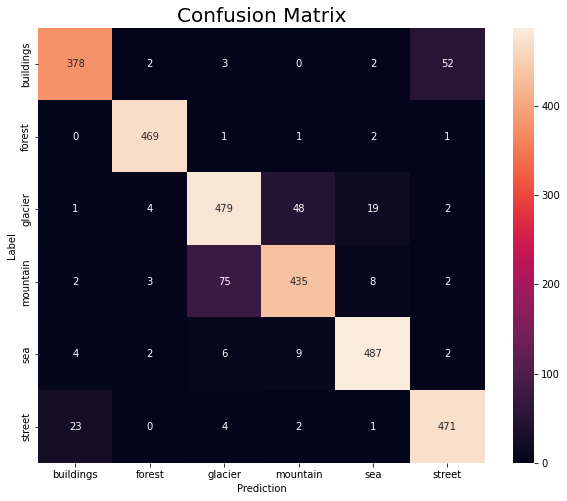

In [107]:
plot_confusion_matrix(test_predictions, groundtruth_list, class_names)

Again, it works just perfectly!

In conclusion, all the models that I tried worked. We can see that transfer learning is very powerful, even without any fine tuning.
The most confusable categories are mountain and glacier. If we look at the pictures, we can see that sometimes, they are very similar.